##### Data-Mining the Audio of Oral History - TECHNE workshop Mar 2017

# 3 Audio Features

The aims of this workbook are to assist you with:
+ learning to inspect audio (look and listen)
+ developing an intuitive understanding of audio features, through plotting and listening 

We will explore this by comparing male and female voices from the University of Sussex Resistance Archive. You will find some example audio with the notebooks, but are welcome to bring your own. 

### Load some files and the libraries
Load up the following audio files -- wait for the [*] to turn to a [1] on the left before you proceed - this tells you it is ready.

In [31]:
from IPython.display import Audio
import librosa, scipy, sklearn

%pylab inline 
figsize(26, 5)


# load up 3 mins of a male and female interview

male, srM = librosa.load("../Maurice_extract_10.wav", duration = 3*60)
female, srF = librosa.load("../Madeleine_extract_10.wav", duration = 3*60)

# and normalise both
male = librosa.util.normalize(male)
female = librosa.util.normalize(female)


Populating the interactive namespace from numpy and matplotlib


An obvious thing we might want to do with an oral history archive is to sort audio recordings into groups based on something that we know about the speakers, for example if they are male or female. To achieve this with MIR technologies we need to find characteristics of the audio which differ between the files. In this example, we will explore variations in rate of speech, pitch and timbre between two recordings: one of a male voice, one of a female voice. Calculating numerical summaries in this way is known as *feature extraction*. There are four features we will look at:

1. Zero crossing rate
2. Energy
3. Various spectral features

## Listen and Look
Before we delve into features, the first step is to get a feel for the two files. 
Let's listen and look at a short segment (25 seconds) of each

In [2]:
Audio(data = male[:srM*25], rate = srM)

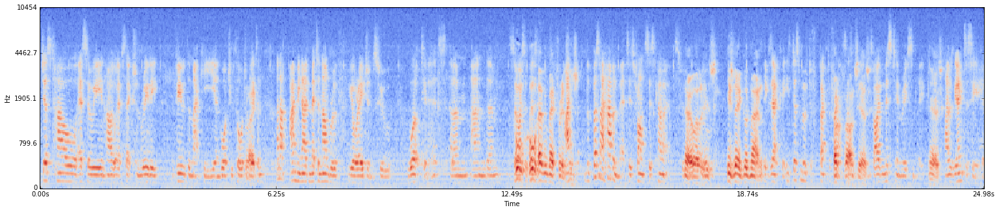

In [6]:
# this melspectrogram is just like the spectrogram in workbook two, but the frequencies are rescaled 
# to better match the way in which we hear -- the output is more meaningful perceptually 

S_male = librosa.feature.melspectrogram(male[:srM*25], sr=srM, n_fft=1024)
logS = librosa.logamplitude(S_male)
librosa.display.specshow(logS, sr=srM, x_axis='time', y_axis='mel')

In this case we can make out the interviewer interjecting at 6, 12 and 17-18 seconds. His deeper voice gives richer harmonics in the lower frequencies.

In [7]:
Audio(data = female[:srF*25], rate = srF)

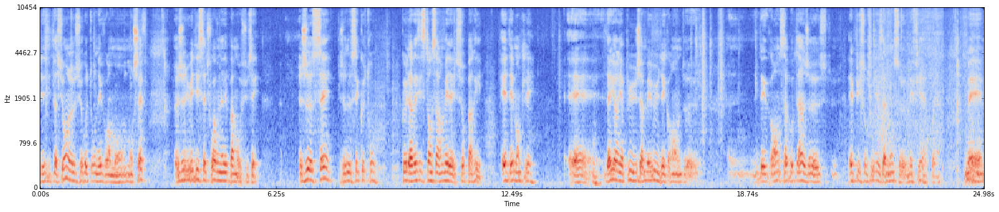

In [8]:
S_female = librosa.feature.melspectrogram(female[:srF*25], sr=srF, n_fft=1024)
logS = librosa.logamplitude(S_female)
librosa.display.specshow(logS, sr=srF, x_axis='time', y_axis='mel')

In this case, we can *see* just how low and rich the female speaker's voice is. The pauses between speech are also notable. Madeleine's voice has a lot of energy in the lower frequencies, but also a wider spread with energy right up into 10kHz

## Zero Crossing Rate
One of the simplest features we can calculate is the **zero crossing rate**. Calculated from a time-domain signal, this indicates the number of times that a signal crosses the horizontal axis. It is a very rough approximation of frequency (higher frequencies are created by more rapid oscillations, so cross zero more often). We can sometimes see silences -- pauses in speach -- too. 

Let's plot the audio in the time-domain


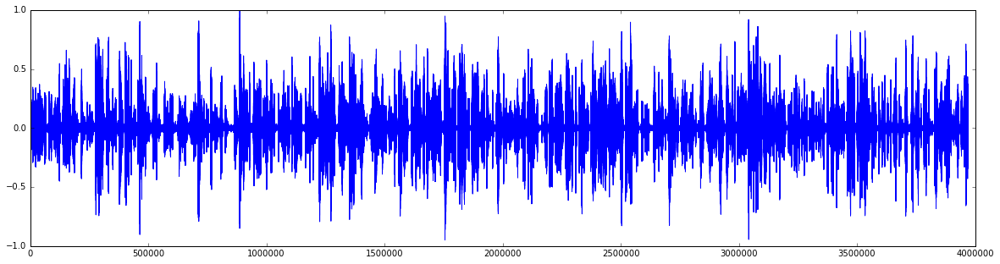

In [10]:

figsize(20, 5)
plot(male)

It's hard to see what's going on with a file this long: Let's zoom in:

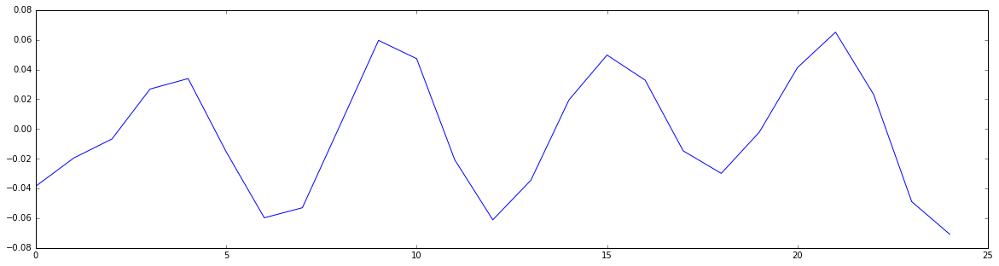

In [11]:
plot(male[1600:1625])

Note how many times the signal crosses zero. For the whole audio file it would of course be impossible to check this visually,  so we can also compute the zero crossings using librosa.

In [12]:
zero_crossings = librosa.zero_crossings(male[1600:1625], pad=False)

That's computed each individual zerocrossing. To find the total number of zero crossings, use sum:

In [13]:
print sum(zero_crossings)

8


We can view the changes in number of zero-crossings over time, use zero_crossing_rate: 

In [14]:
zcrs_m = librosa.feature.zero_crossing_rate(male[:srM*25])
# .shape shows us how many rows and columns there are in our matrix
print zcrs_m.shape

(1, 1077)


Let's check the total number of zero-crossings in Maurice's 3 min file and plot the rate:

Male, total zero-crossings = 
64610


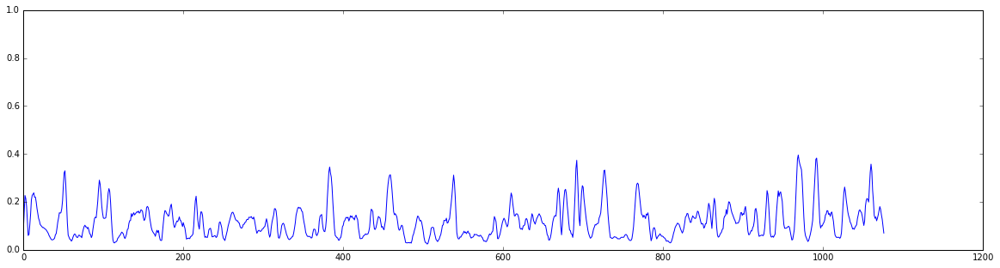

In [19]:
print "Male, total zero-crossings = " 
print sum(librosa.zero_crossings(male[:srM*25], pad=False))
plot(zcrs_m[0])
axis([0, 1200, 0, 1])
?plot

Let's compare Male and Female zero crossing rate

Female, total zero-crossings = 
72889


[0, 1200, 0, 1]

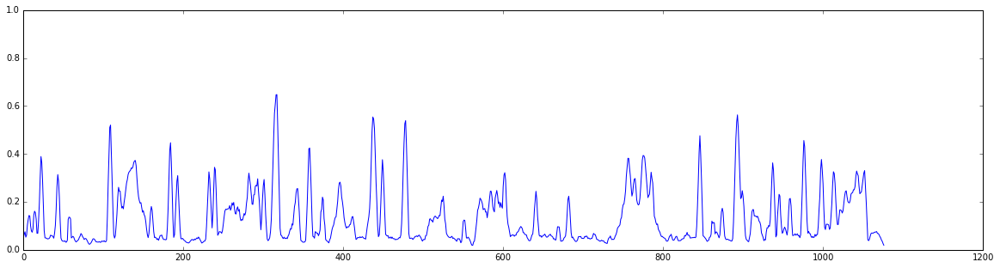

In [20]:
print "Female, total zero-crossings = "
print sum(librosa.zero_crossings(female[:srF*25], pad=False))

zcrs_f = librosa.feature.zero_crossing_rate(female[:srF*25])
plt.plot(zcrs_f[0])
axis([0, 1200, 0, 1])

Here we can see the pauses in Madeleine's speech indicated by the areas where the zero crossing rate stays low for a while. We also see a wider range of values, just as we saw a wide distribution of energy in the spectrogram. Zero-crossings can help us find pauses in speech and will vary a lot between speaker to speaker.



## RMS - energy

Another intuitive measure is RMSE which stands for "Root Mean Squared Error" - this is another simple time domain feature which gives a measure of energy. It literally calculates how much the waveform deviates from zero, giving a simple measure of loudness. This in itself can be a quick and simple means of detecting whether the interviewer is, for example. 

Let's look at a different interview: 


In [32]:
# load up a new file

figsize(26, 5)
andr, srA = librosa.load("../AndreeDumon.wav")

# and normalise both
andr = librosa.util.normalize(andr)


Let's have a listen - we can hear the interviewer at the start, who is relatively quiet. Andree then starts speaking just after 6 seconds

In [23]:
Audio(data = andr, rate = srA)

We can see very clearly the change from interviewer to interviewee in a spectrogram at 6.5 seconds

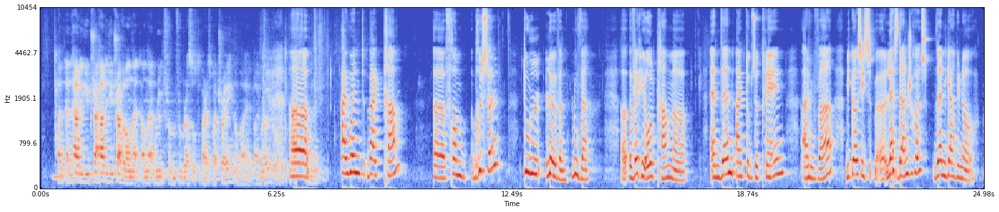

In [24]:
S_A = librosa.feature.melspectrogram(andr[:srM*25], sr=srM, n_fft=1024)
logA = librosa.logamplitude(S_A)
librosa.display.specshow(logA, sr=srA, x_axis='time', y_axis='mel')

But this is still a lot of information. The interviewer is quieter, and we can see this in the spectrogram representation as a fainter colour red.


The RMSE gives us a more efficient measure of the same information. If we were working with vast audio archives, this computational efficiency is very welcome ... 

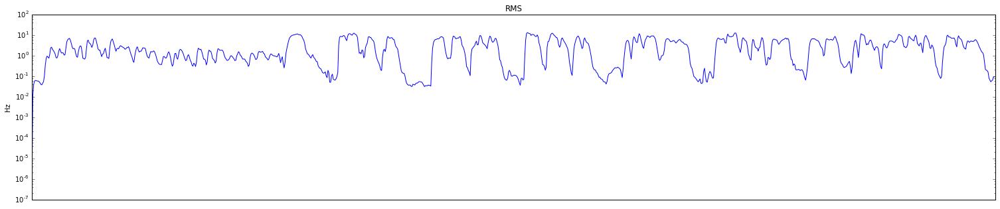

In [40]:
# calculate the RMS values over 25 seconds

RMS = librosa.feature.rmse(andr[:srA*25])

plt.semilogy(RMS.T, label='RMS')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, RMS.shape[-1]])
plt.title('RMS')


We can see very clearly in this one feature the difference between the interviewer and interviewee ...

## Spectral Features
Whereas zero-crossing and RMS was calculated in the time domain, spectral features are calculated in the frequency domain, describing aspects of pitch. The 'spectrum' referred to is the harmonic spectrum. In music, spectral features can be used to described notes, melody, rhythm, and timbral descriptors such as instrument recognition.


Let's calculate a series of spectral features for 25 seconds from Maurice and Madeleine



In [51]:

maleSpecCentroid = librosa.feature.spectral_centroid(male[:srF*25], srM)
maleSpecBandwidth = librosa.feature.spectral_bandwidth(male[:srF*25], srM)
maleSpecRolloff = librosa.feature.spectral_rolloff(male[:srF*25], srM)
maleRMS = librosa.feature.rmse(male[:srF*25])


Now we can plot them all together

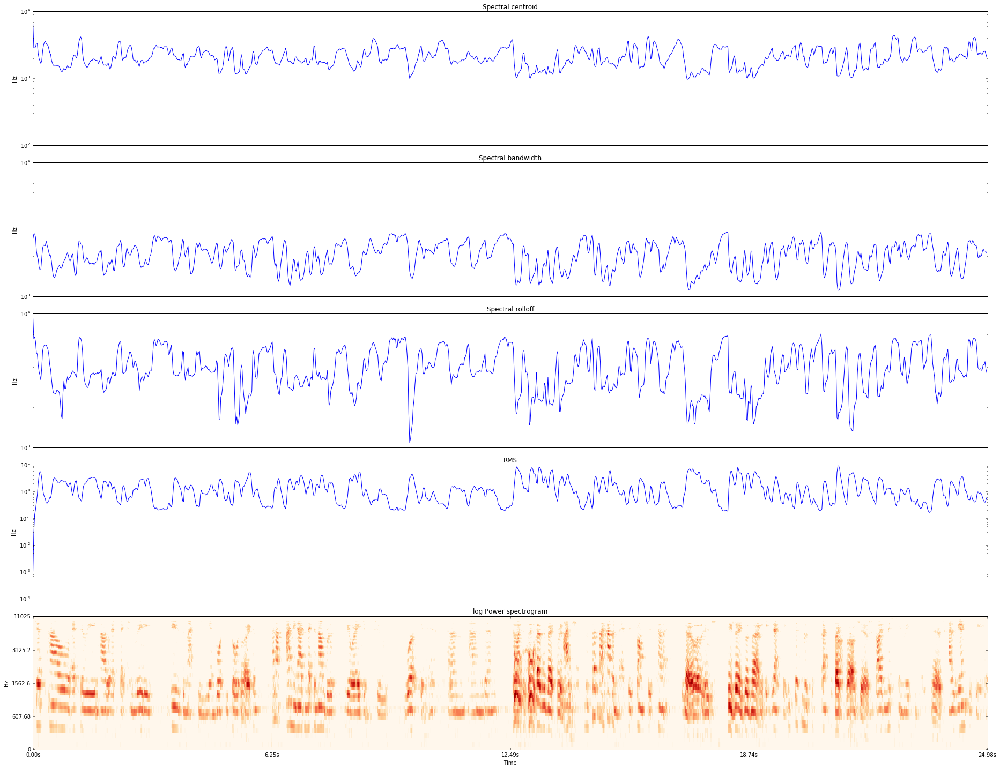

In [52]:
import matplotlib.pyplot as plt
figsize(26, 20)
plt.figure()
plt.subplot(5, 1, 1)
plt.semilogy(maleSpecCentroid.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, maleSpecCentroid.shape[-1]])
plt.title('Spectral centroid')

plt.subplot(5, 1, 2)
plt.semilogy(maleSpecBandwidth.T, label='Spectral bandwidth')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, maleSpecCentroid.shape[-1]])
plt.title('Spectral bandwidth')

plt.subplot(5, 1, 3)
plt.semilogy(maleSpecRolloff.T, label='Spectral rolloff')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, maleSpecCentroid.shape[-1]])
plt.title('Spectral rolloff')

plt.subplot(5, 1, 4)
plt.semilogy(maleRMS.T, label='RMS')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, maleRMS.shape[-1]])
plt.title('RMS')


plt.subplot(5, 1, 5)
librosa.display.specshow(librosa.logamplitude(S_male**2, ref_power=np.max), y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

In [46]:
femaleSpecCentroid = librosa.feature.spectral_centroid(female[:srF*25], srF)
femaleSpecBandwidth = librosa.feature.spectral_bandwidth(female[:srF*25], srF)
femaleSpecRolloff = librosa.feature.spectral_rolloff(female[:srF*25], srF)
femaleRMS = librosa.feature.rmse(female[:srF*25])

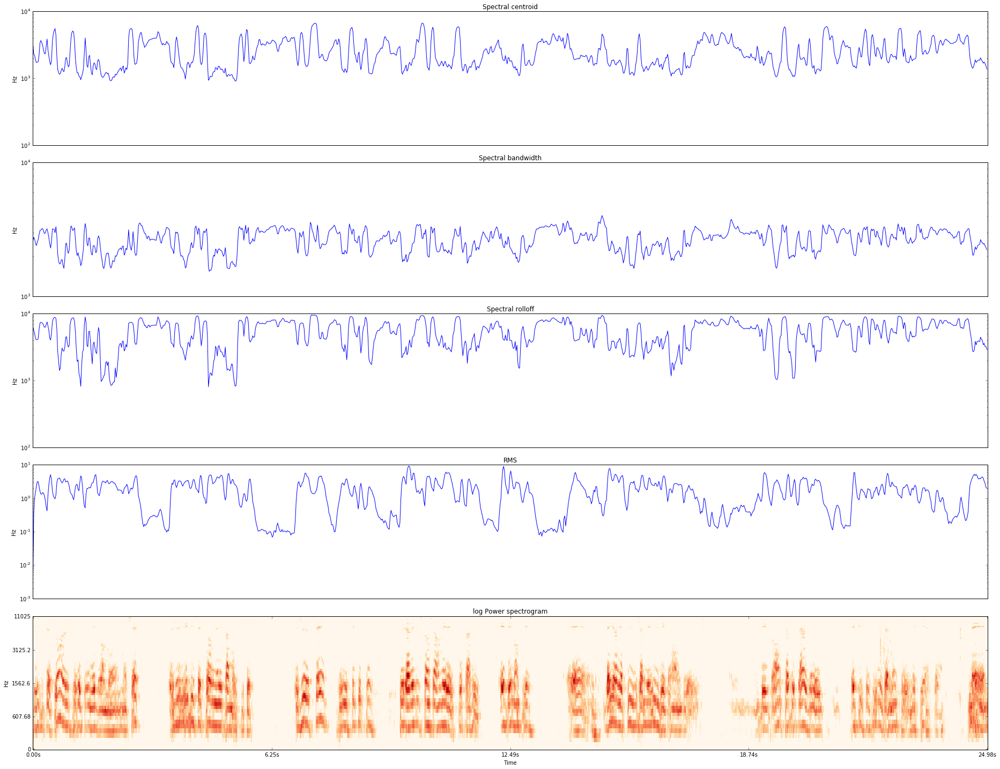

In [53]:
plt.figure()
plt.subplot(5, 1, 1)
plt.semilogy(femaleSpecCentroid.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, femaleSpecCentroid.shape[-1]])
plt.title('Spectral centroid')

plt.subplot(5, 1, 2)
plt.semilogy(femaleSpecBandwidth.T, label='Spectral bandwidth')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, femaleSpecCentroid.shape[-1]])
plt.title('Spectral bandwidth')

plt.subplot(5, 1, 3)
plt.semilogy(femaleSpecRolloff.T, label='Spectral rolloff')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, femaleSpecCentroid.shape[-1]])
plt.title('Spectral rolloff')

plt.subplot(5, 1, 4)
plt.semilogy(femaleRMS.T, label='RMS')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, femaleRMS.shape[-1]])
plt.title('RMS')

plt.subplot(5, 1, 5)
librosa.display.specshow(librosa.logamplitude(S_female**2, ref_power=np.max), y_axis='log', x_axis='time')
plt.title('log Power spectrogram')
plt.tight_layout()

We can start to see some differences in the patterns of some of the features over time, but already, just in 10 minutes it is hard to pin point differences. We need to find a way to summarise these. 
These are two 25 second files, we are thinking about ways of working with *hours* of audio ... 

# Summary
We have explored some *features* - ways of describing characteristics of the sound files. So *features* here just means characteristics, or properties. If we wanted to describe a set of images, we could talk about brightness, redness, texture, etc. These are just the same. These features are defined in terms of maths which a computer can do. The trick is to work out which ones make sense to us -- which are perceptually meaningful and relevant to our research question.

Having got this far, we can carry out the same process on larger audio files and start looking at summaries which might help us understand audio in new ways, or simply automatically tag, or organise files. 

